In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, Embedding, Concatenate, Multiply
from tensorflow.keras.layers import BatchNormalization, Activation, LeakyReLU, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam


In [3]:
img_rows, img_cols, channels = 28, 28, 1  # MNIST image dimensions
latent_dim = 100  # Dimensionality of the noise vector
num_classes = 10  # Number of classes in the MNIST dataset


In [4]:
(x_train, y_train), (_, _) = mnist.load_data()

# Rescale -1 to 1
x_train = x_train.astype(np.float32) / 127.5 - 1.
x_train = np.expand_dims(x_train, axis=3)
y_train = y_train.reshape(-1, 1)


11490434/11490434 [==============================] - 0s 0us/step


In [5]:
def build_generator(latent_dim, num_classes):
    noise_input = Input(shape=(latent_dim,))
    label_input = Input(shape=(1,), dtype='int32')
    label_embedding = Embedding(num_classes, latent_dim, input_length=1)(label_input)
    label_embedding = Flatten()(label_embedding)

    model_input = Multiply()([noise_input, label_embedding])

    model = Sequential()
    model.add(Dense(7*7*256, use_bias=False, input_dim=latent_dim))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    model.add(Reshape((7, 7, 256)))
    model.add(Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    model.add(Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    noise_img = model(model_input)
    return Model([noise_input, label_input], noise_img)


In [6]:
def build_discriminator(img_shape, num_classes):
    img_input = Input(shape=img_shape)
    label_input = Input(shape=(1,), dtype='int32')

    label_embedding = Embedding(num_classes, np.prod(img_shape), input_length=1)(label_input)
    label_embedding = Flatten()(label_embedding)
    label_embedding = Reshape(img_shape)(label_embedding)

    concatenated = Concatenate(axis=-1)([img_input, label_embedding])

    model = Sequential()
    model.add(Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=(img_shape[0], img_shape[1], img_shape[2] + 1)))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.3))
    model.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.3))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    validity = model(concatenated)
    return Model([img_input, label_input], validity)


In [7]:
from tensorflow.keras.optimizers import legacy

# Use legacy version of Adam
optimizer = legacy.Adam(0.0002, 0.5)

def compile_models(generator, discriminator, latent_dim, num_classes):
    optimizer = legacy.Adam(0.0002, 0.5)

    # Compile discriminator
    discriminator.compile(loss='binary_crossentropy',
                          optimizer=optimizer,
                          metrics=['accuracy'])

    # Set discriminator to not trainable when training generator
    discriminator.trainable = False

    # Inputs for the combined model
    noise_input = Input(shape=(latent_dim,))
    label_input = Input(shape=(1,), dtype='int32')
    img = generator([noise_input, label_input])

    # Discriminator determines validity
    validity = discriminator([img, label_input])

    # Combined model (stacked generator and discriminator)
    combined = Model([noise_input, label_input], validity)
    combined.compile(loss='binary_crossentropy', optimizer=optimizer)

    return discriminator, combined

In [8]:
latent_dim = 100
num_classes = 10
img_shape = (28, 28, 1)

# Create the generator and discriminator
generator = build_generator(latent_dim, num_classes)
discriminator = build_discriminator(img_shape, num_classes)

# Compile the models
discriminator, combined = compile_models(generator, discriminator, latent_dim, num_classes)

In [9]:
import matplotlib.pyplot as plt

def save_and_display_images(epoch, generator, latent_dim, num_classes, examples=10, dimension=10, save_path='images'):
    import os
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    noise = np.random.normal(0, 1, (examples * dimension, latent_dim))
    sampled_labels = np.array([num for _ in range(examples) for num in range(dimension)])
    gen_imgs = generator.predict([noise, sampled_labels])
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale images 0 - 1

    fig, axs = plt.subplots(examples, dimension, figsize=(10, 10))
    cnt = 0
    for i in range(examples):
        for j in range(dimension):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    fig.suptitle(f"Epoch: {epoch}", fontsize=20)
    plt.show()
    fig.savefig(f"{save_path}/mnist_{epoch}.png")
    plt.close()


In [10]:
def train(generator, discriminator, combined, epochs, batch_size=128, save_interval=50):
    (X_train, y_train), (_, _) = mnist.load_data()
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    X_train = np.expand_dims(X_train, axis=3)

    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        imgs, labels = X_train[idx], y_train[idx]

        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        gen_imgs = generator.predict([noise, labels])

        d_loss_real = discriminator.train_on_batch([imgs, labels], valid)
        d_loss_fake = discriminator.train_on_batch([gen_imgs, labels], fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)


        sampled_labels = np.random.randint(0, 10, batch_size).reshape(-1, 1)
        g_loss = combined.train_on_batch([noise, sampled_labels], valid)

        if epoch % save_interval == 0:
            print(f'Epoch {epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]:.2f}%] [G loss: {g_loss}]')
            save_and_display_images(epoch, generator, latent_dim, num_classes)


1/1 [==============================] - 0s 394ms/step
Epoch 0 [D loss: 0.7405282258987427, acc.: 15.62%] [G loss: 0.6843767762184143]
4/4 [==============================] - 0s 74ms/step


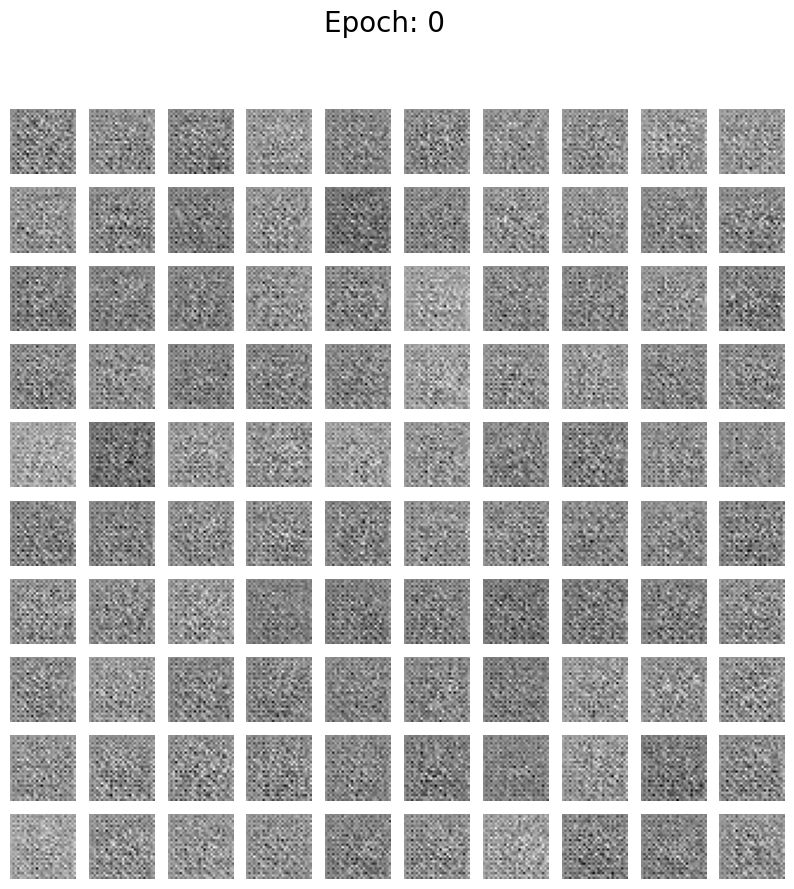

1/1 [==============================] - 0s 203ms/step
Epoch 1000 [D loss: 0.7530312538146973, acc.: 35.94%] [G loss: 0.8205506205558777]
4/4 [==============================] - 0s 85ms/step


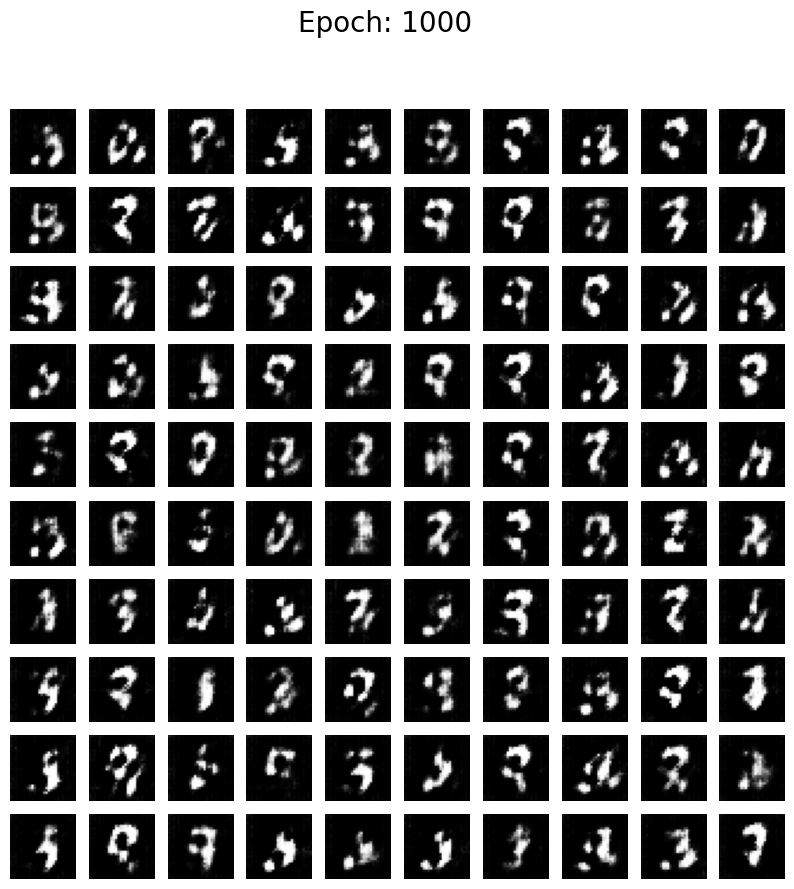

1/1 [==============================] - 0s 122ms/step
Epoch 2000 [D loss: 0.6290027797222137, acc.: 71.88%] [G loss: 0.866574227809906]
4/4 [==============================] - 0s 90ms/step


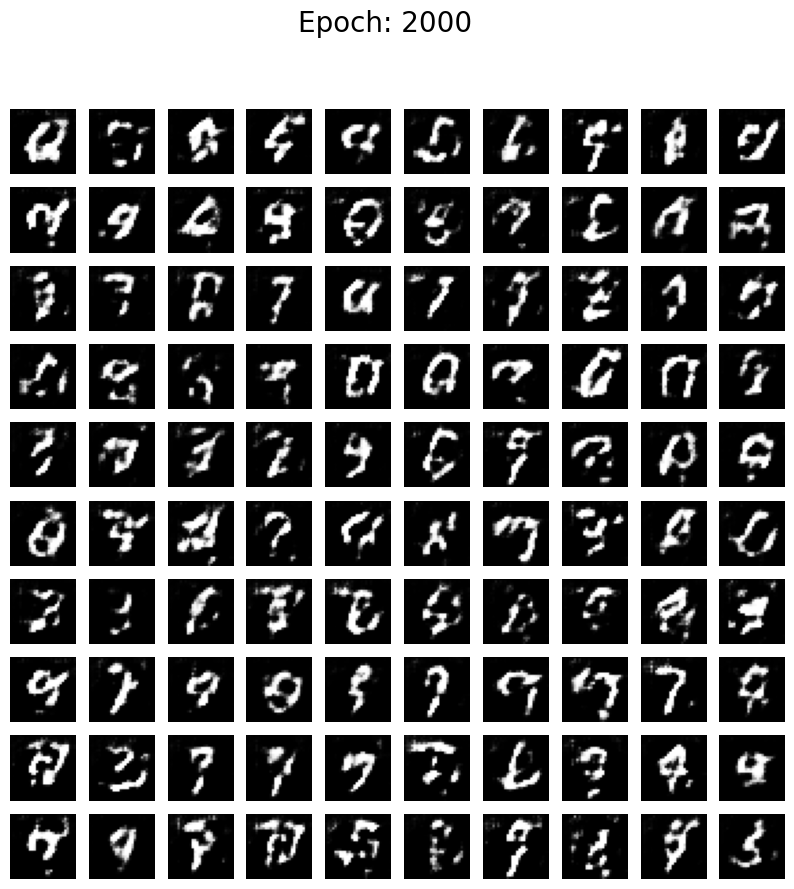

1/1 [==============================] - 0s 121ms/step
Epoch 3000 [D loss: 0.6714027523994446, acc.: 64.06%] [G loss: 0.7447083592414856]
4/4 [==============================] - 0s 123ms/step


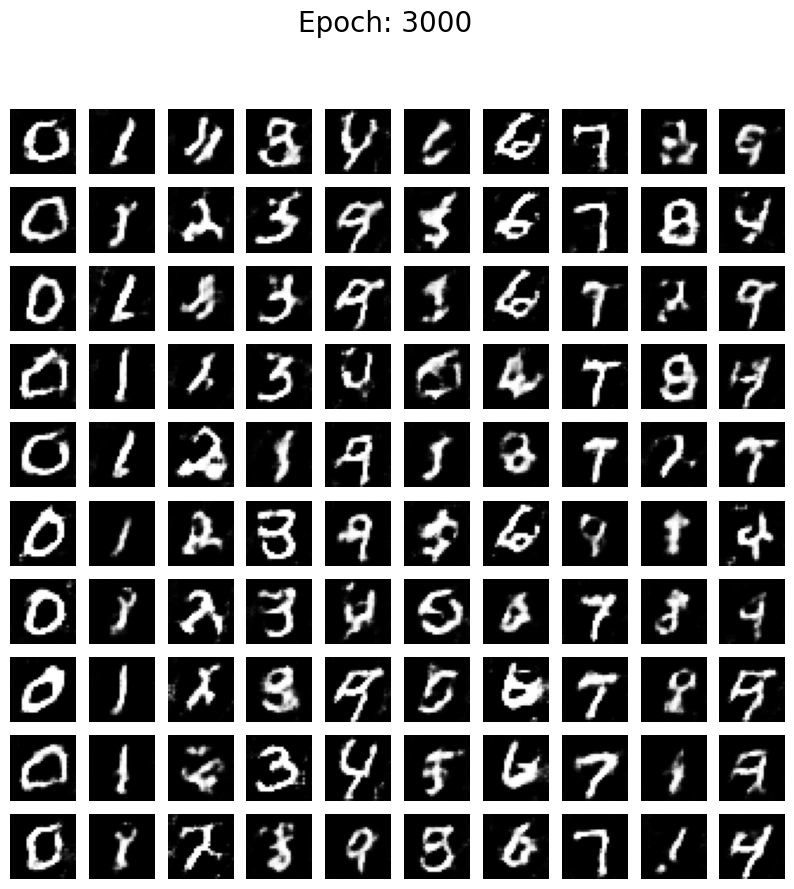

1/1 [==============================] - 0s 191ms/step
Epoch 4000 [D loss: 0.7042588293552399, acc.: 45.31%] [G loss: 0.7355160713195801]
4/4 [==============================] - 1s 117ms/step


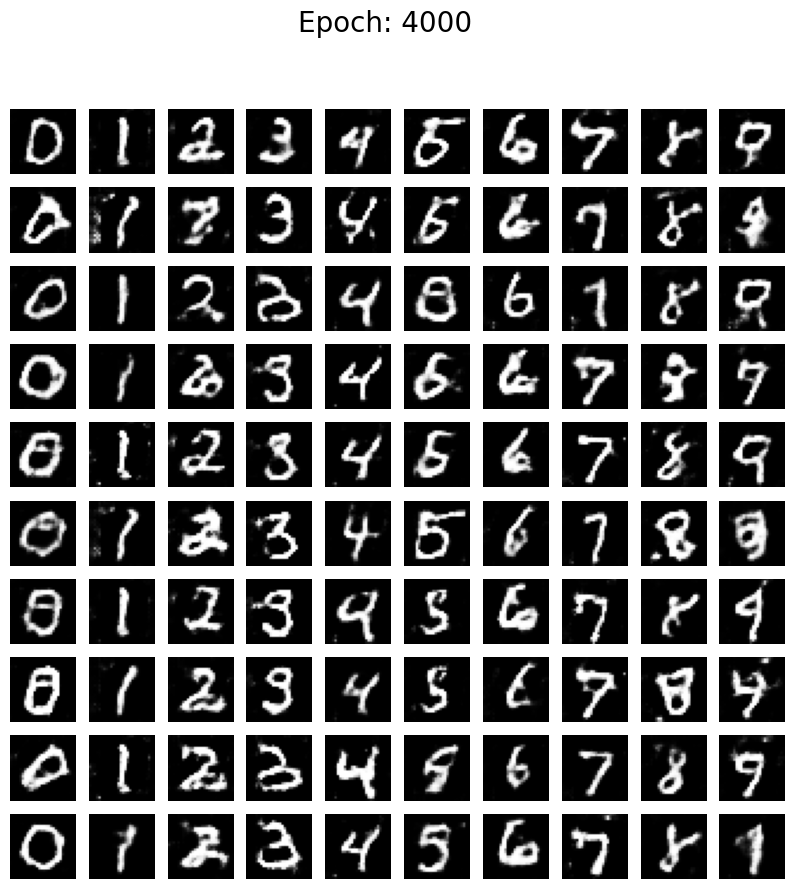

1/1 [==============================] - 0s 122ms/step
Epoch 5000 [D loss: 0.6795340478420258, acc.: 62.50%] [G loss: 0.7155597805976868]
4/4 [==============================] - 0s 95ms/step


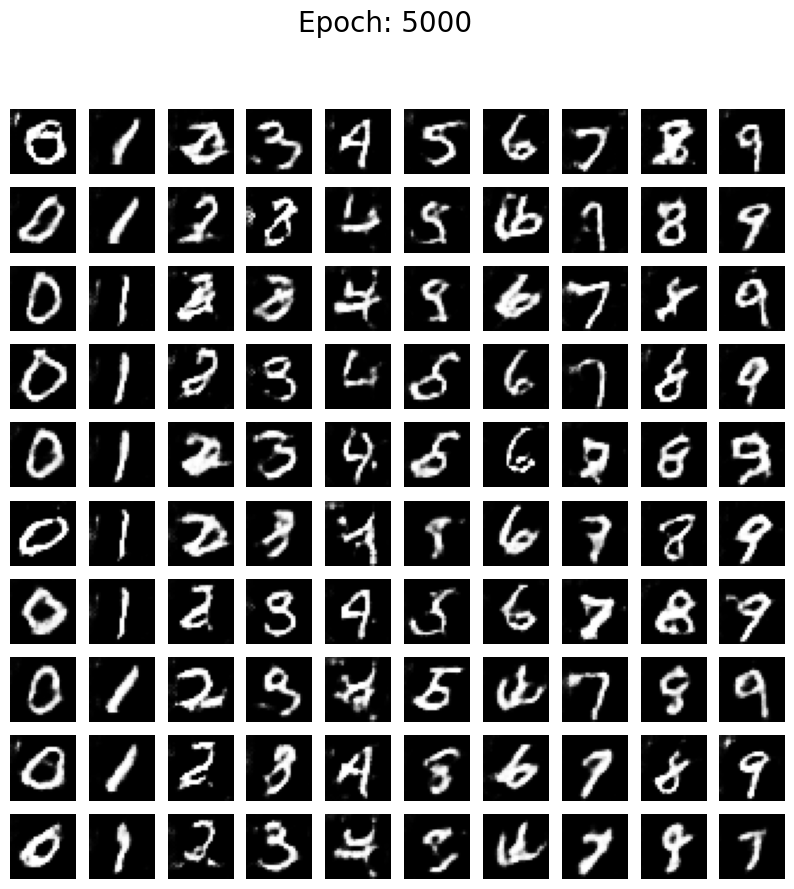

1/1 [==============================] - 0s 133ms/step
Epoch 6000 [D loss: 0.6860983073711395, acc.: 53.12%] [G loss: 0.7429882287979126]
4/4 [==============================] - 0s 104ms/step


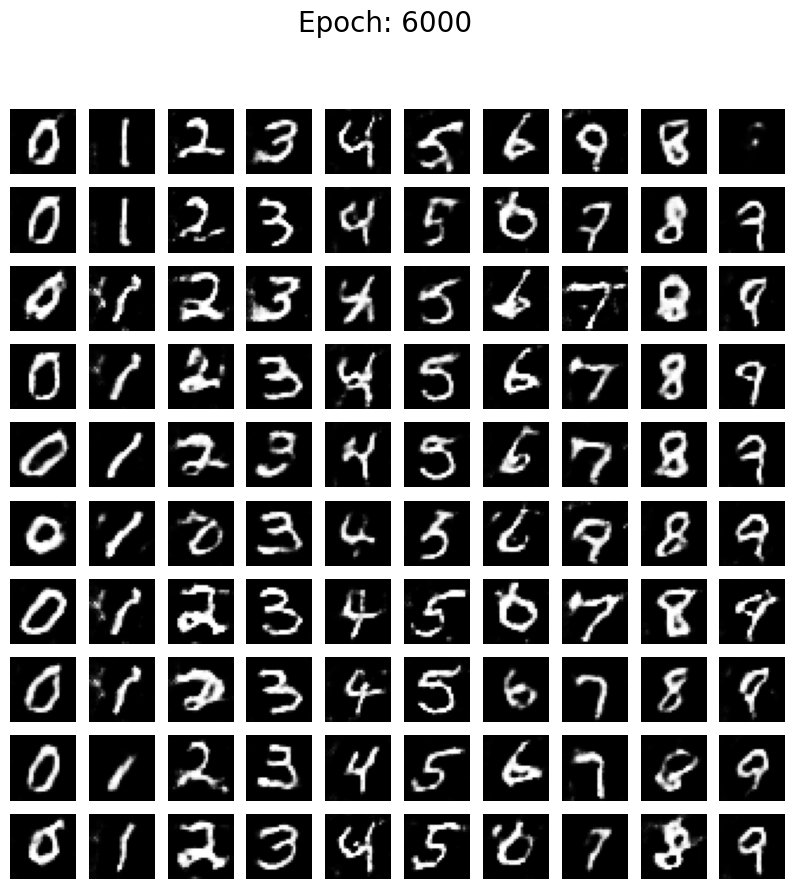

1/1 [==============================] - 0s 122ms/step
Epoch 7000 [D loss: 0.6767838001251221, acc.: 62.50%] [G loss: 0.7473115921020508]
4/4 [==============================] - 0s 101ms/step


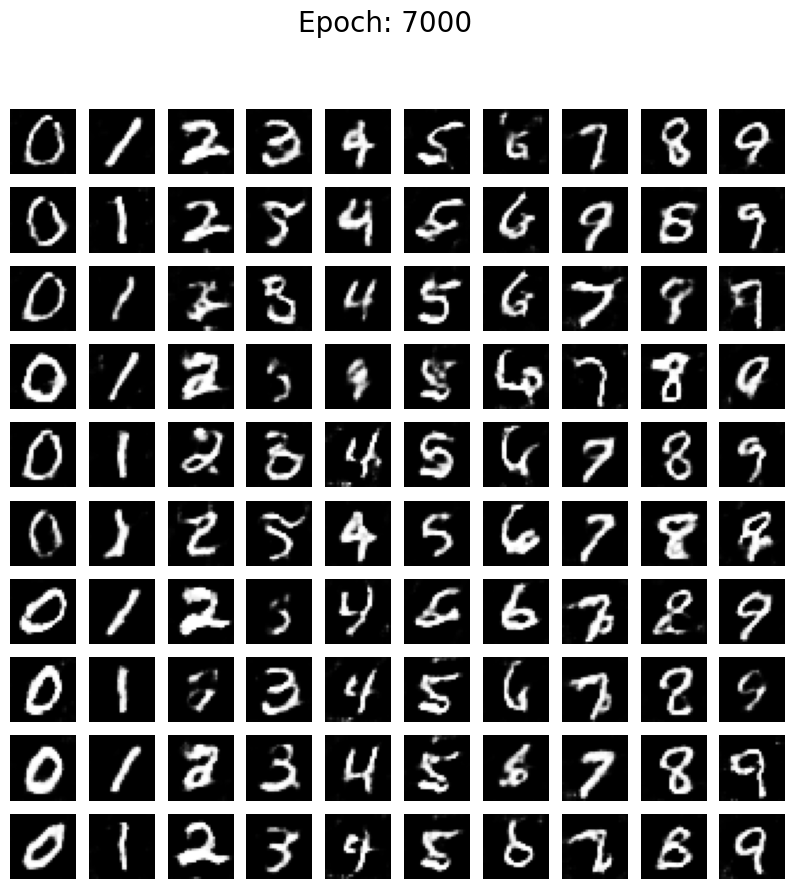

1/1 [==============================] - 0s 133ms/step
Epoch 8000 [D loss: 0.695586085319519, acc.: 53.12%] [G loss: 0.7470132112503052]
4/4 [==============================] - 0s 98ms/step


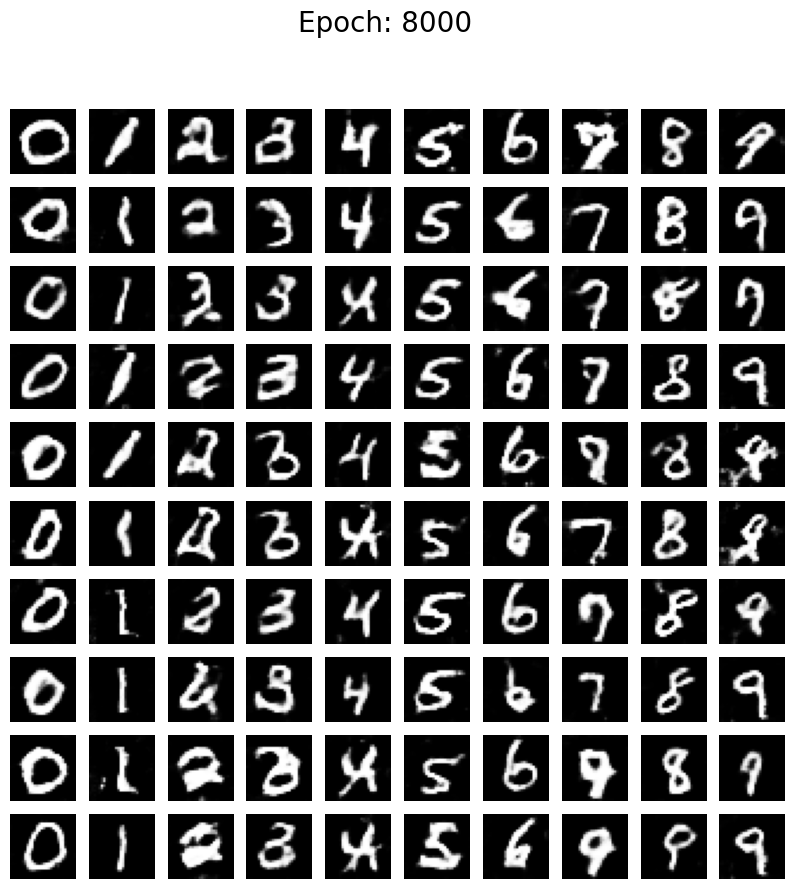

1/1 [==============================] - 0s 116ms/step
Epoch 9000 [D loss: 0.6926725506782532, acc.: 48.44%] [G loss: 0.700748860836029]
4/4 [==============================] - 0s 108ms/step


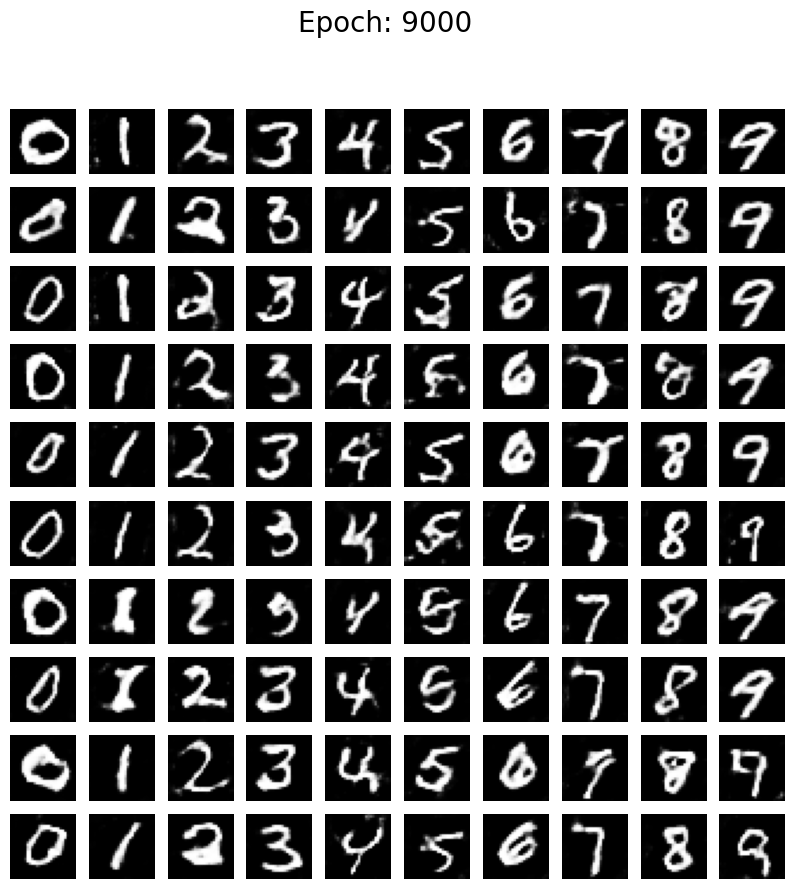

1/1 [==============================] - 0s 118ms/step
Epoch 10000 [D loss: 0.7095302641391754, acc.: 46.88%] [G loss: 0.7621333599090576]
4/4 [==============================] - 1s 134ms/step


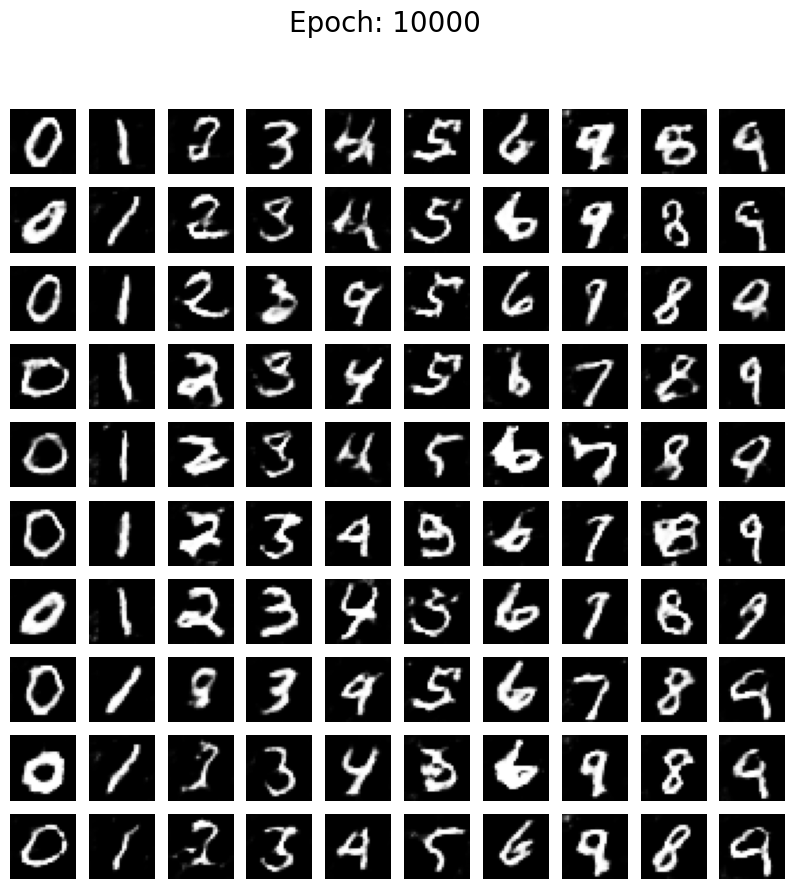

1/1 [==============================] - 0s 122ms/step
Epoch 11000 [D loss: 0.6834815144538879, acc.: 60.94%] [G loss: 0.7253642678260803]
4/4 [==============================] - 0s 106ms/step


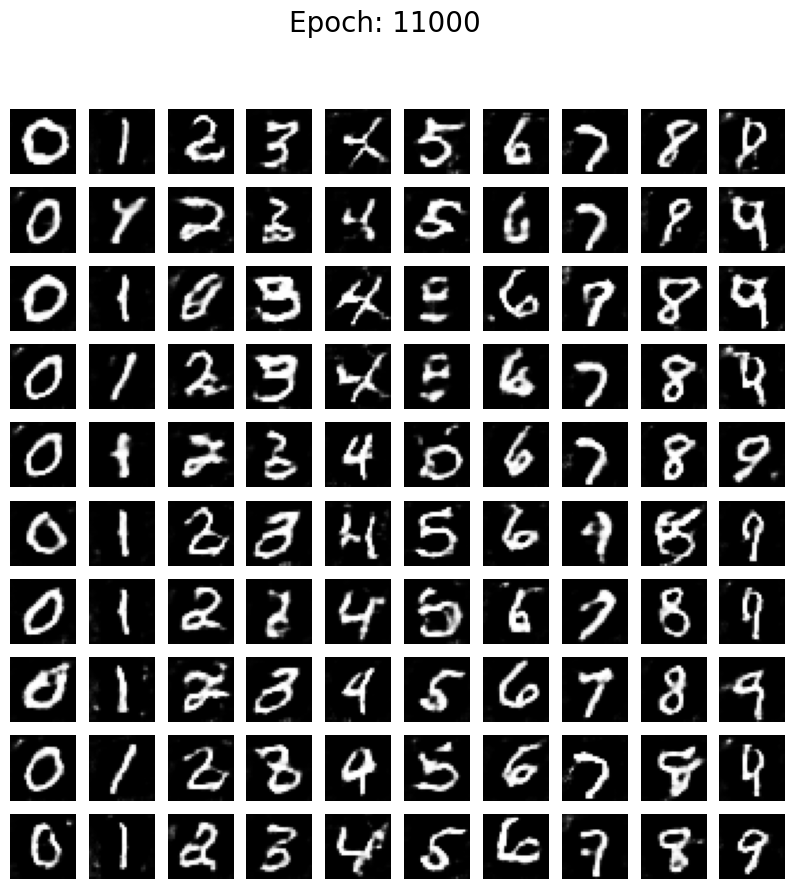

1/1 [==============================] - 0s 130ms/step
Epoch 12000 [D loss: 0.6718902885913849, acc.: 65.62%] [G loss: 0.7289590835571289]
4/4 [==============================] - 0s 106ms/step


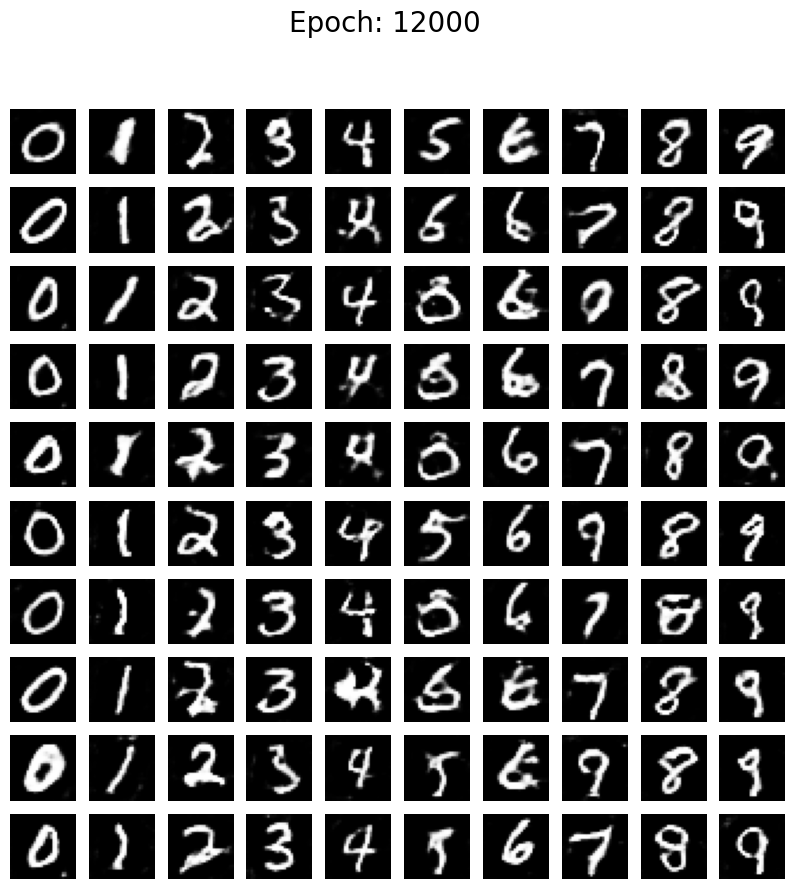

1/1 [==============================] - 0s 124ms/step
Epoch 13000 [D loss: 0.6954729855060577, acc.: 54.69%] [G loss: 0.7630162835121155]
4/4 [==============================] - 0s 112ms/step


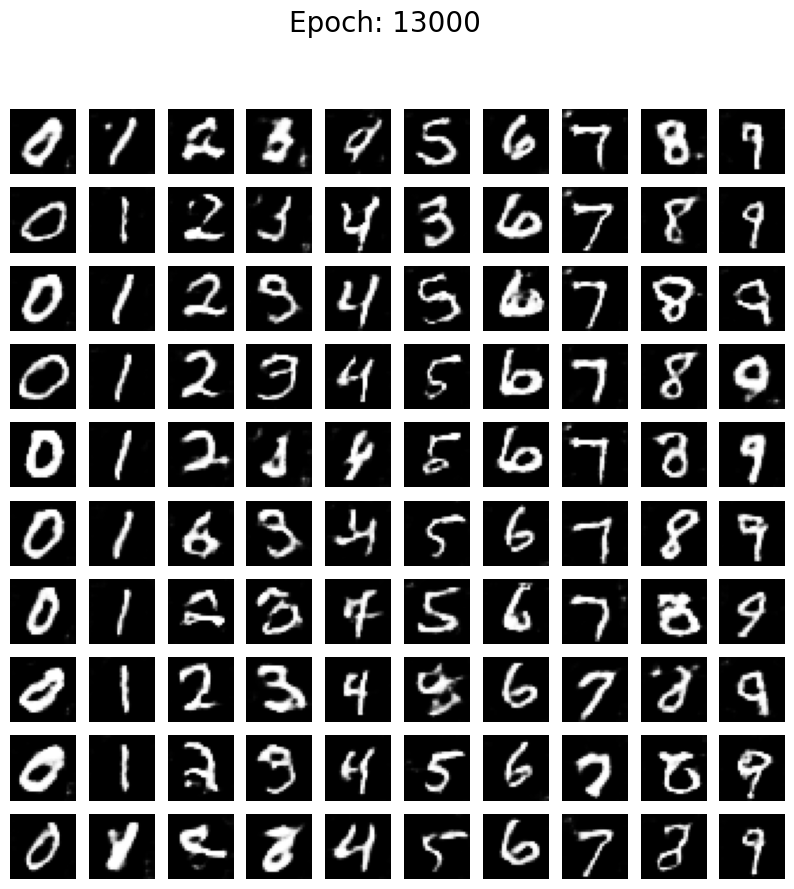

1/1 [==============================] - 0s 125ms/step
Epoch 14000 [D loss: 0.6987087428569794, acc.: 57.81%] [G loss: 0.7043421268463135]
4/4 [==============================] - 1s 130ms/step


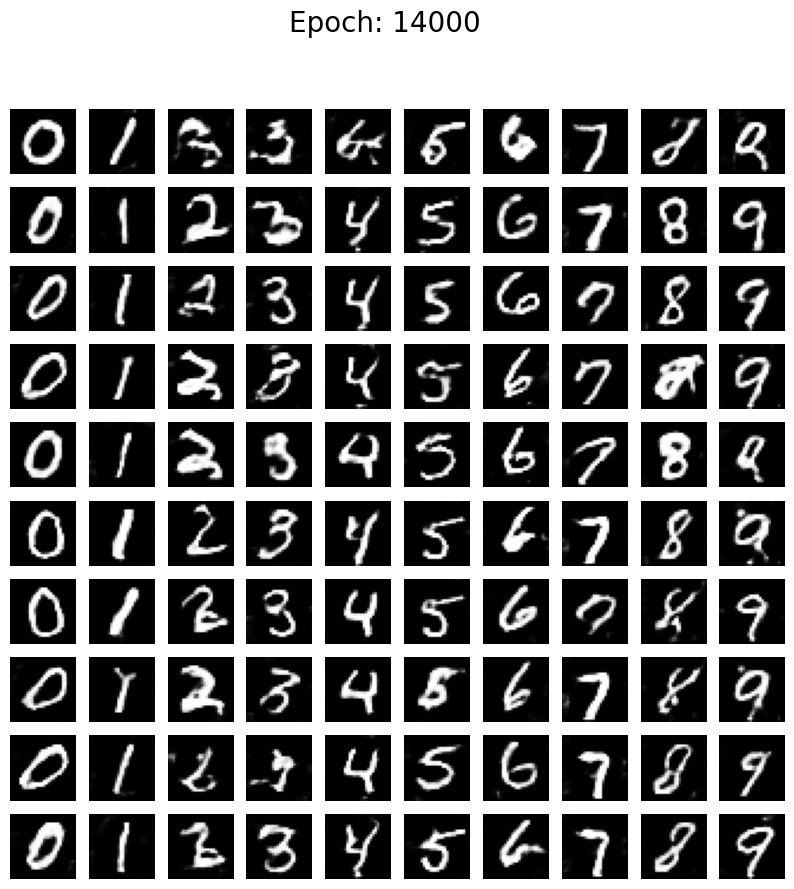

1/1 [==============================] - 0s 207ms/step


In [12]:
latent_dim = 100
num_classes = 10
img_shape = (28, 28, 1)
epochs = 15000
batch_size = 32
save_interval = 1000

generator = build_generator(latent_dim, num_classes)
discriminator = build_discriminator(img_shape, num_classes)
discriminator, combined = compile_models(generator, discriminator, latent_dim, num_classes)

train(generator, discriminator, combined, epochs, batch_size, save_interval)

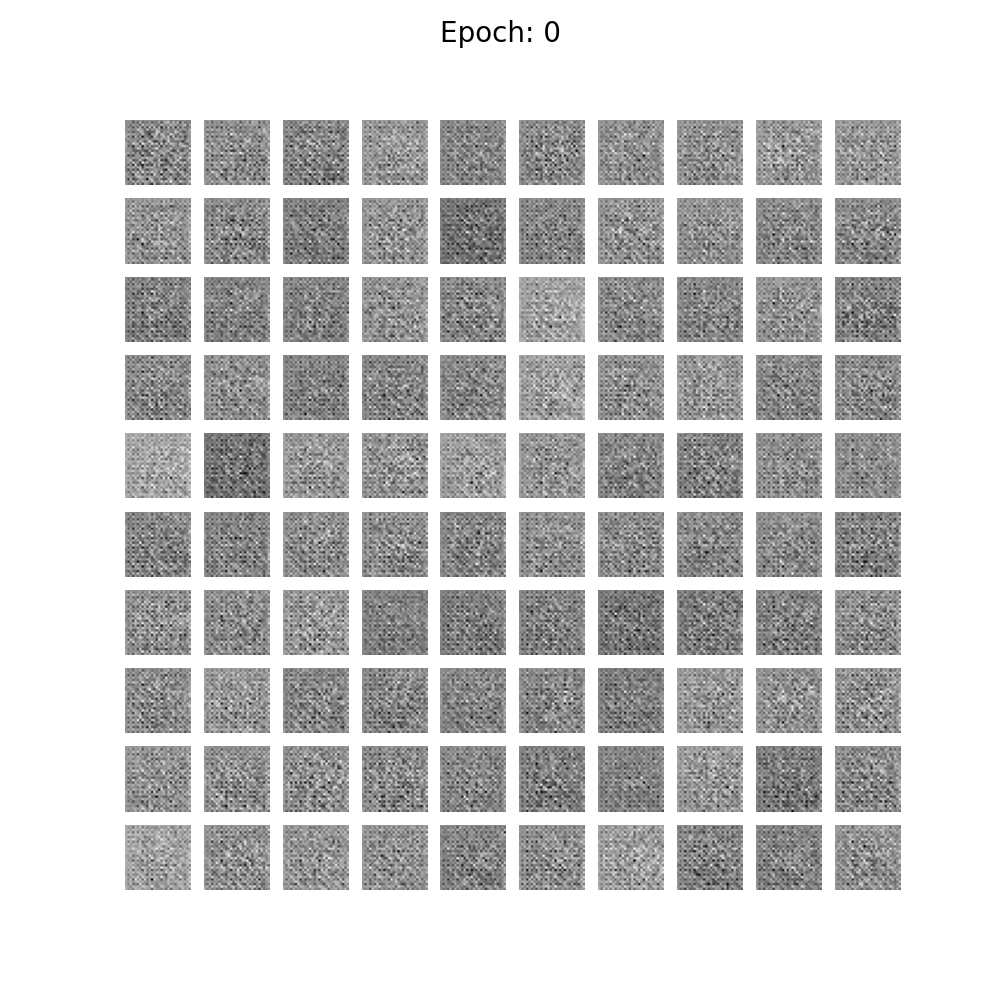

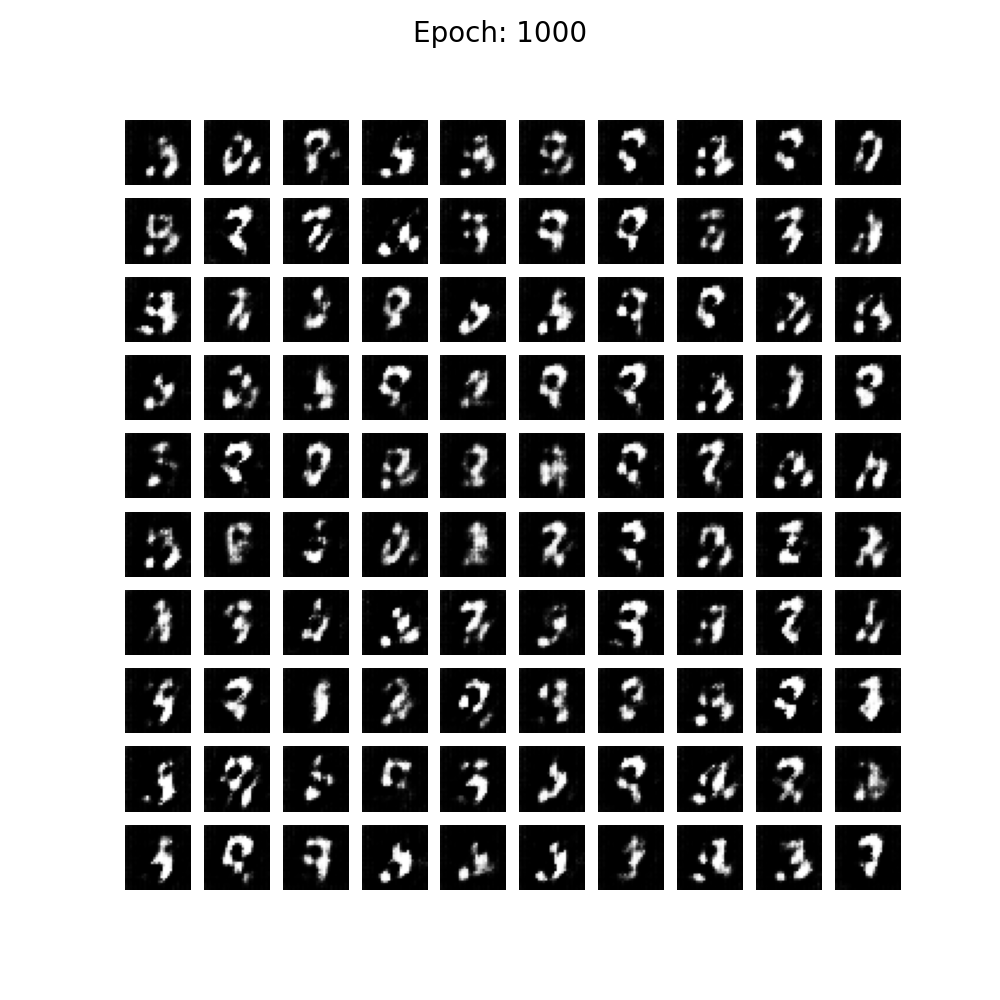

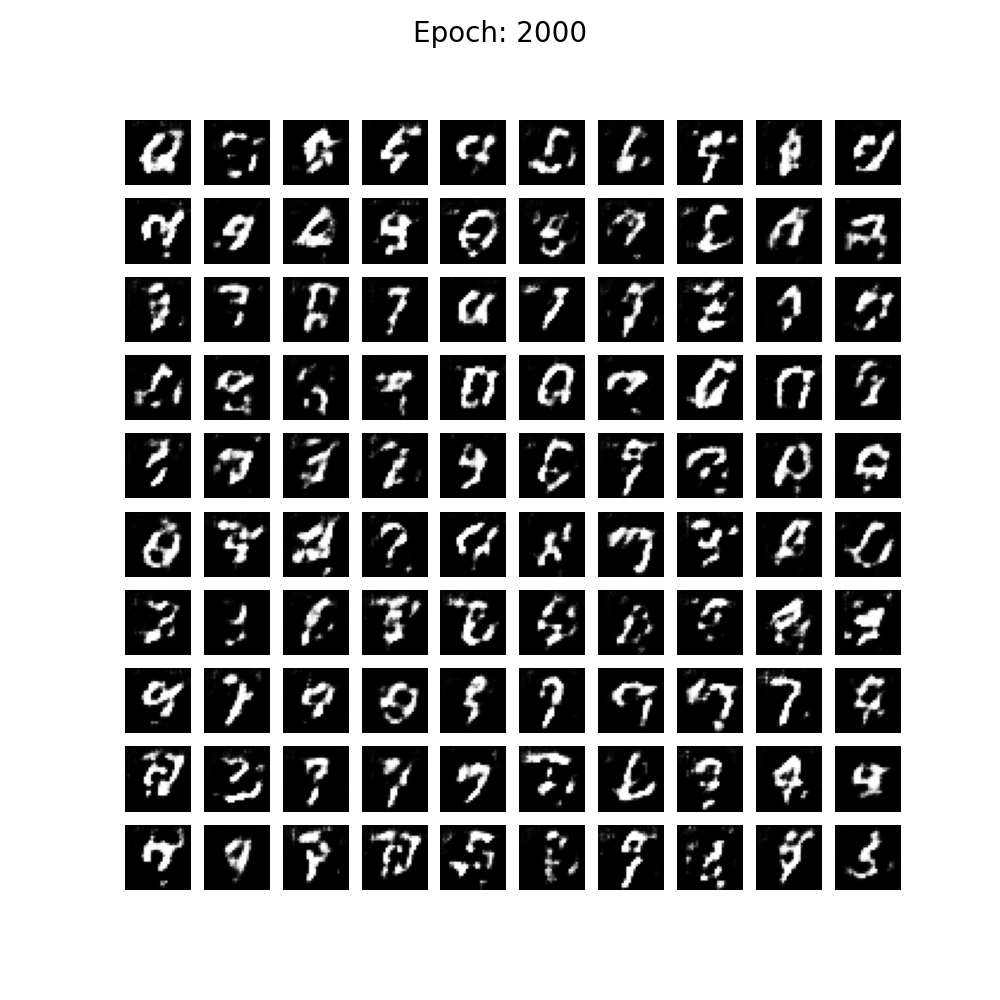

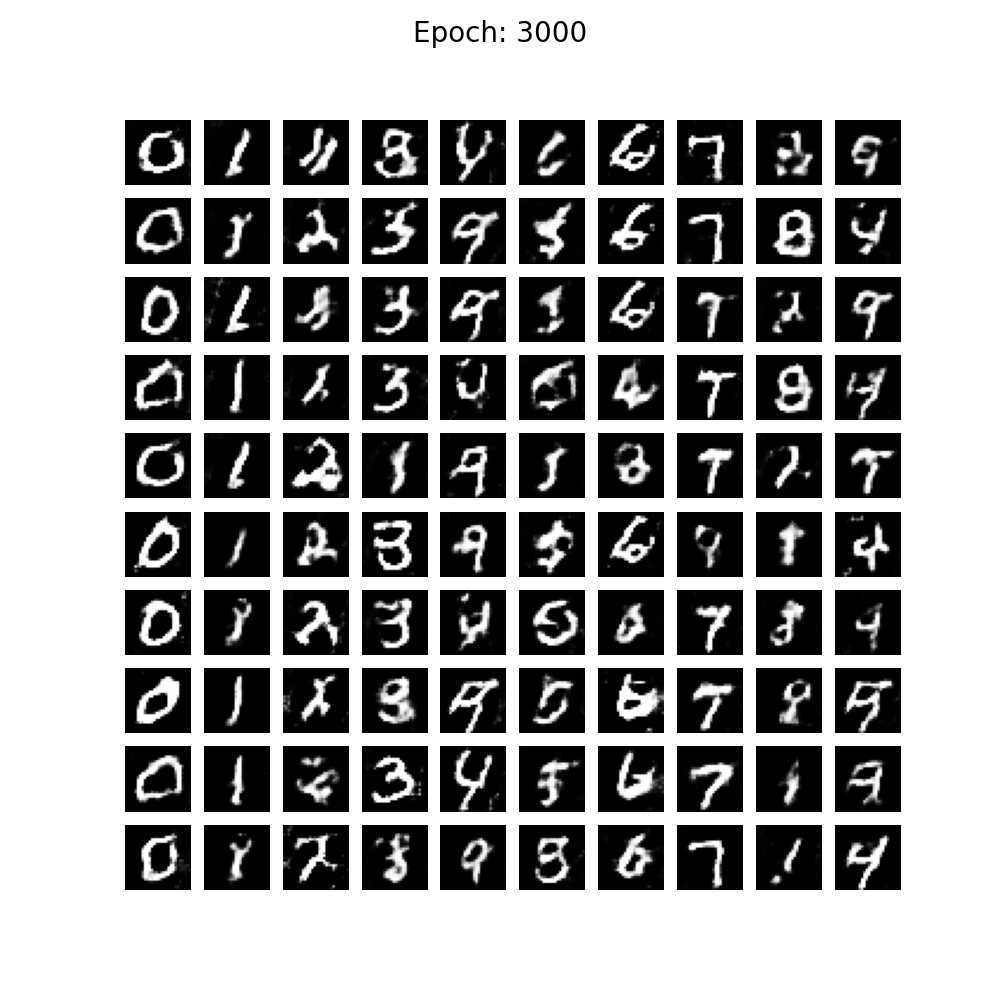

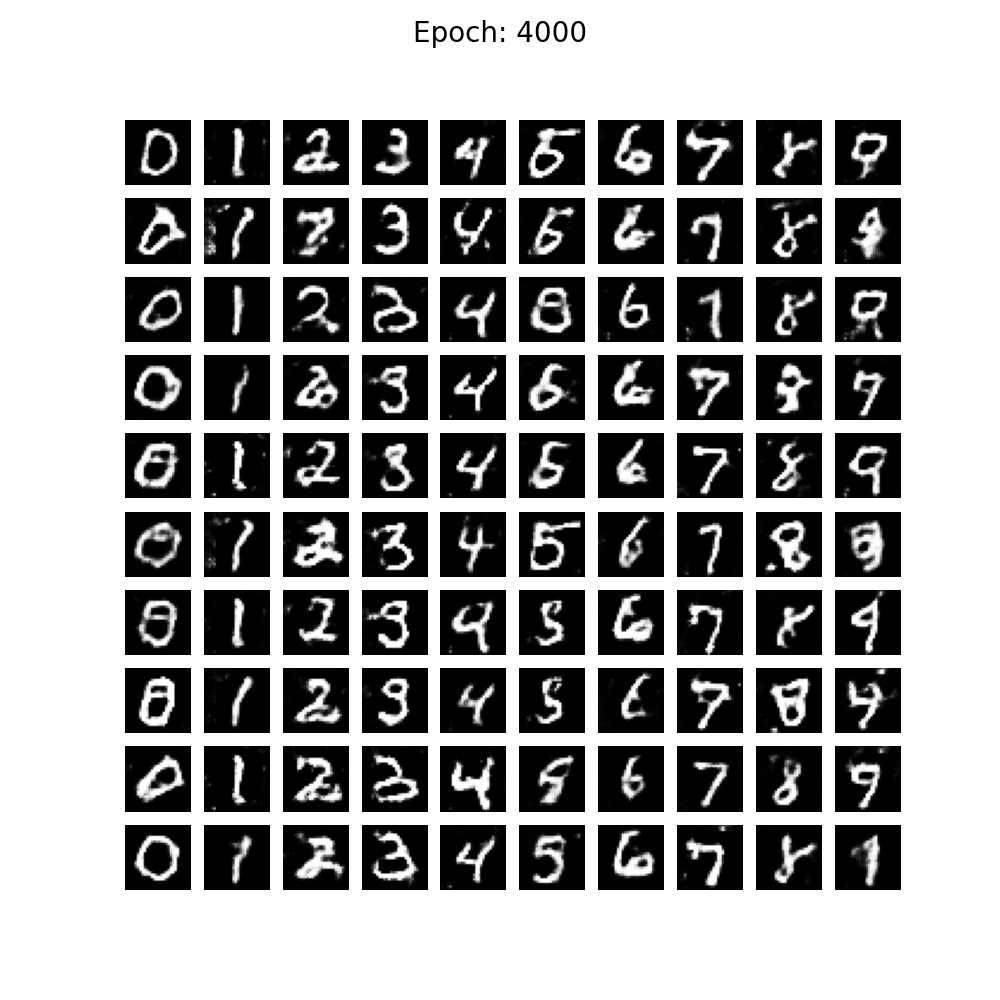

...

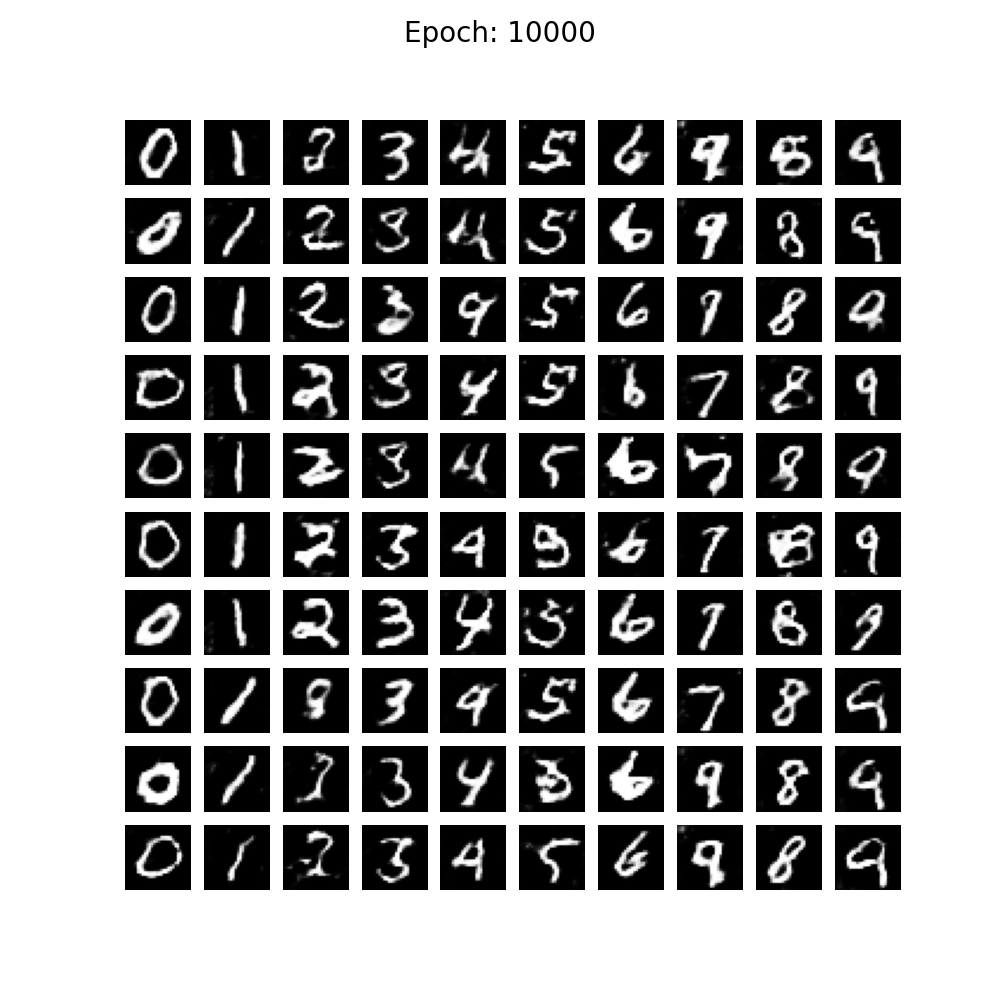

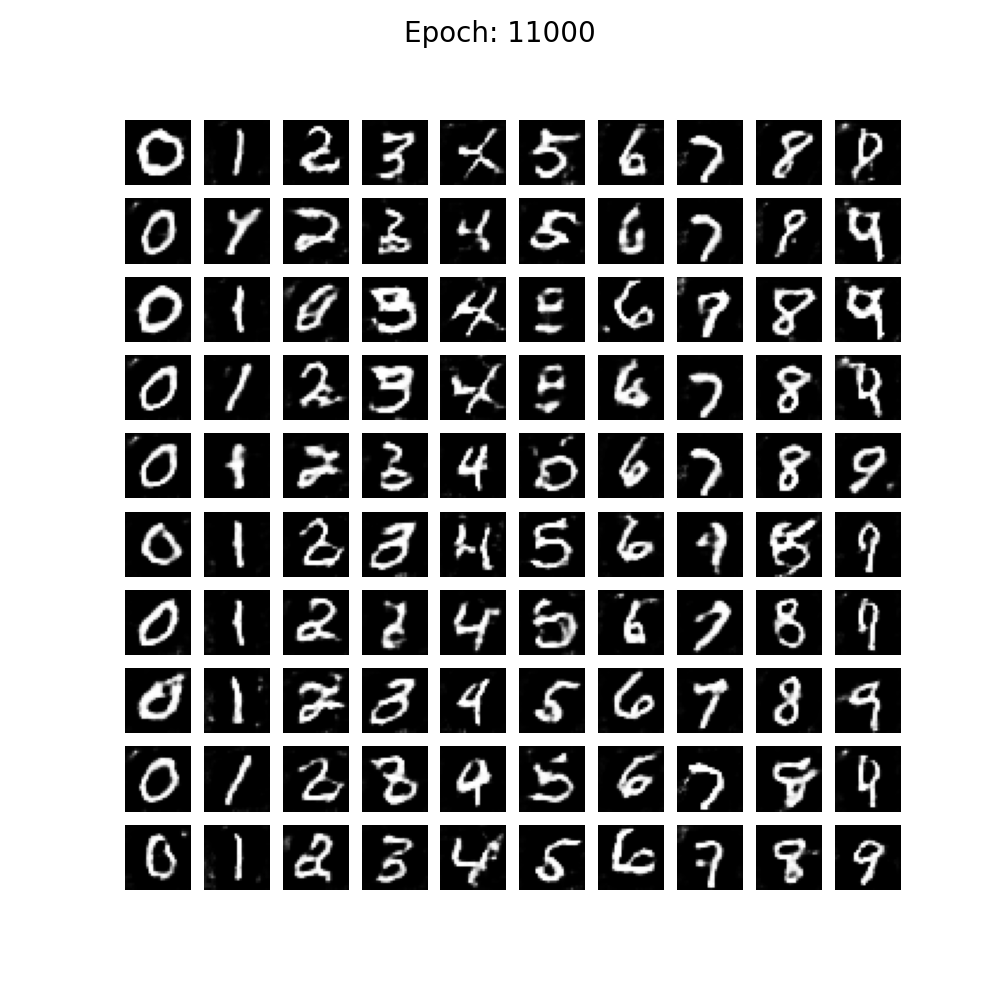

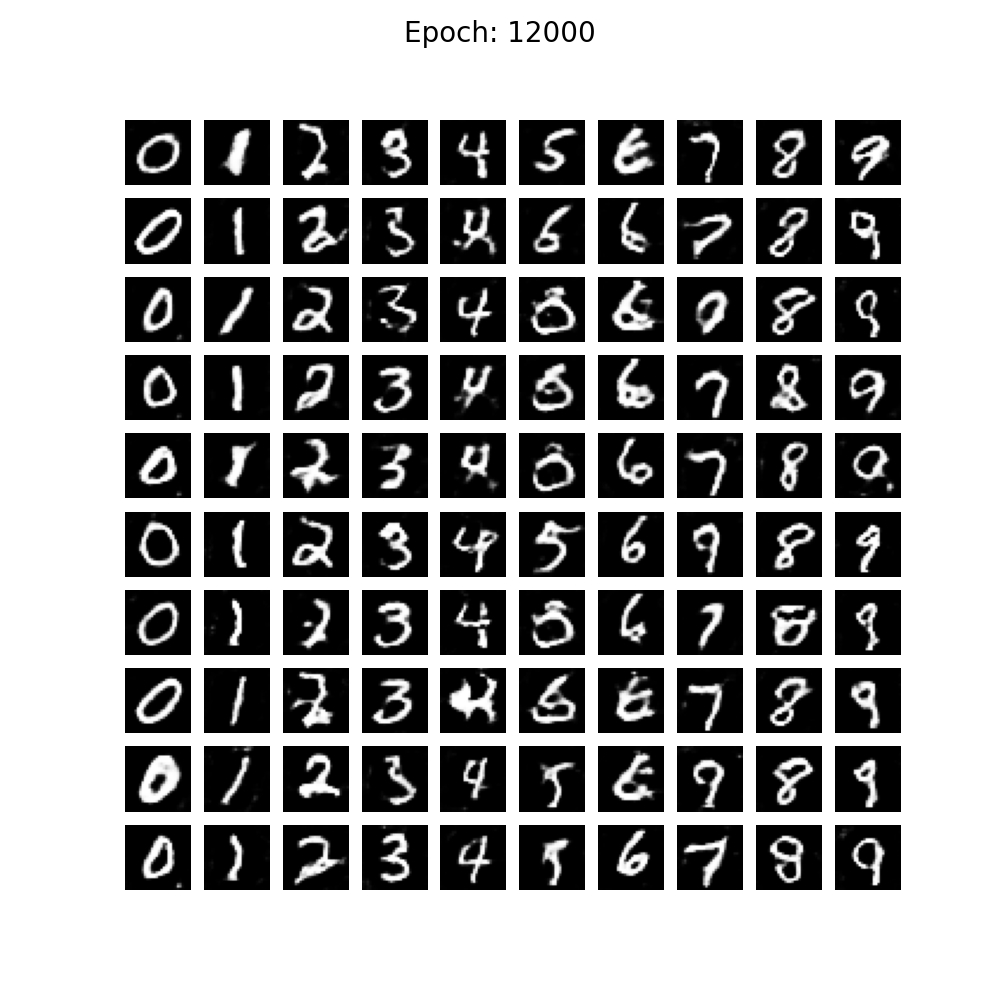

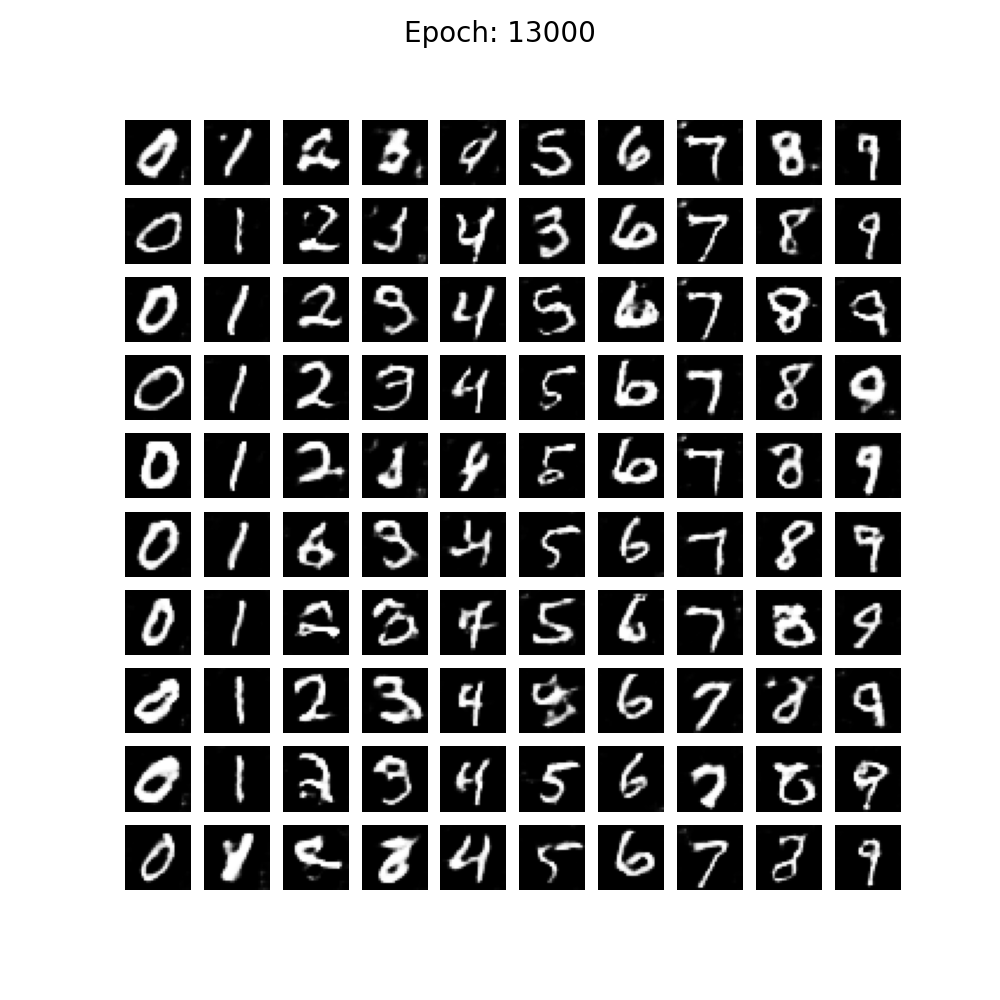

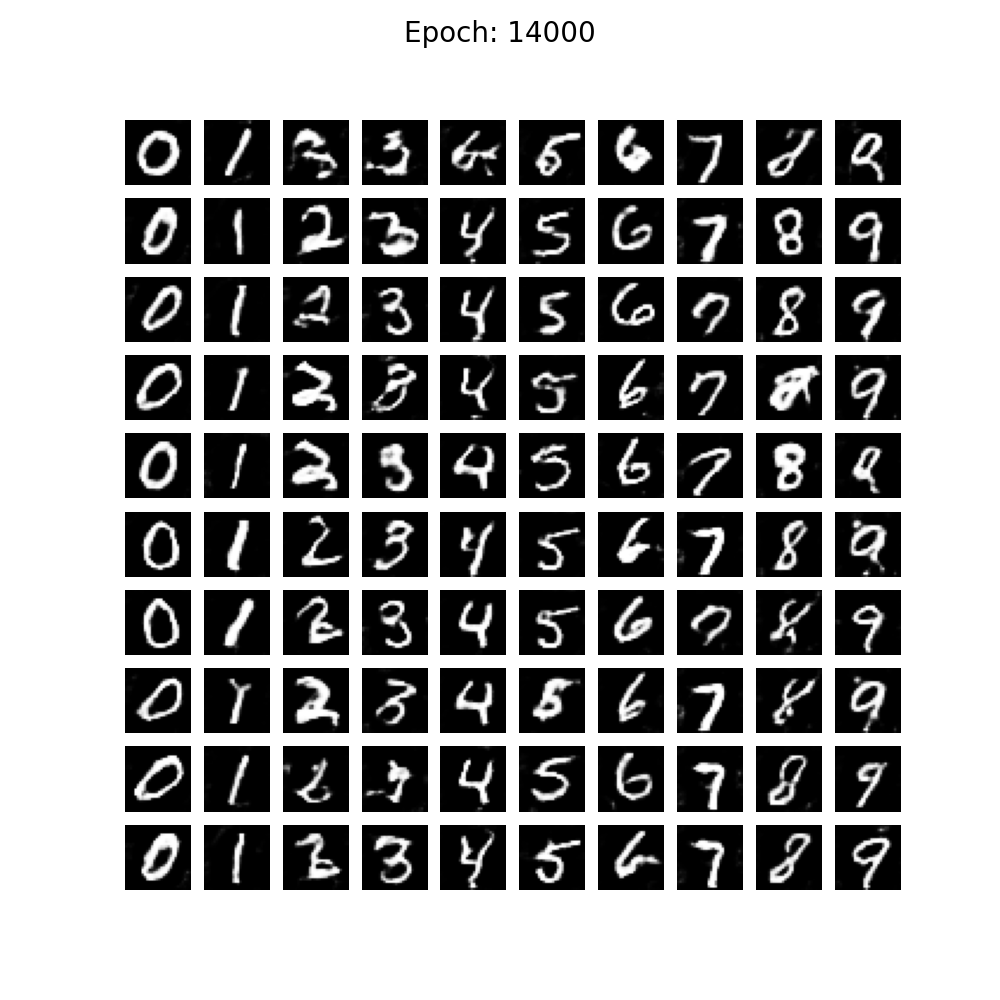

In [13]:
from IPython.display import Image, display
import os

# Define the path to your images directory
images_directory = '/content/images'

# List out the image files in the directory
image_files = os.listdir(images_directory)

# Sort the files if necessary (assuming you want numerical order)
image_files.sort(key=lambda x: int(x.split('_')[1].split('.')[0]))

# Loop through and display each image
for image_file in image_files:
    display(Image(filename=os.path.join(images_directory, image_file)))


Enter a digit you want to generate (0-9): 7
1/1 [==============================] - 0s 36ms/step


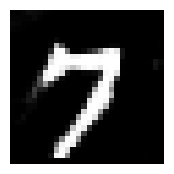

In [20]:
import numpy as np
import matplotlib.pyplot as plt

def generate_and_display_digit(generator, digit, latent_dim):
    # Generate random noise
    noise = np.random.normal(0, 1, (1, latent_dim))

    # Convert digit to label format for the generator (as an array)
    label = np.array([digit])

    # Generate the image conditioned on the label
    generated_image = generator.predict([noise, label])

    # Rescale image pixel values to [0, 1]
    generated_image = 0.5 * generated_image + 0.5

    # Plot the result
    plt.figure(figsize=(2, 2))
    plt.imshow(generated_image[0, :, :, 0], cmap='gray')
    plt.axis('off')
    plt.show()

# Ask for user input
desired_digit = int(input("Enter a digit you want to generate (0-9): "))

# Ensure the digit is within the valid range
if 0 <= desired_digit <= 9:
    # Call the function with the user's desired digit
    generate_and_display_digit(generator=generator, digit=desired_digit, latent_dim=100)
else:
    print("Please enter a valid digit between 0 and 9.")
